In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [12]:
df = pd.read_csv("/content/drive/MyDrive/datasets/GlobalLandTemperaturesByCountry.csv")
df.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [13]:
df.shape

(577462, 4)

In [14]:
df.describe()

,AverageTemperature,AverageTemperatureUncertainty
count,544811.000000,545550.000000
mean,17.193354,1.019057
std,10.953966,1.201930
min,-37.658000,0.052000
25%,10.025000,0.323000
50%,20.901000,0.571000
75%,25.814000,1.206000
max,38.842000,15.003000


In [15]:
df.isna().sum()

,0
dt,0
AverageTemperature,32651
AverageTemperatureUncertainty,31912
Country,0


In [16]:
df['dt']=pd.to_datetime(df['dt'])
# df.set_index('dt',inplace=True)
# df.index

In [17]:
df.dropna(subset=['AverageTemperature'], inplace=True)


In [18]:
df.isna().sum()


,0
dt,0
AverageTemperature,0
AverageTemperatureUncertainty,0
Country,0


In [19]:
import seaborn as sns

In [20]:
data = df[df['Country']=='India']

In [21]:
data.head(100)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
243695,1796-01-01,17.044,2.044,India
243696,1796-02-01,19.193,1.359,India
243697,1796-03-01,22.319,2.125,India
243698,1796-04-01,27.233,1.510,India
243699,1796-05-01,30.035,1.338,India
...,...,...,...,...
243796,1804-06-01,29.952,1.333,India
243797,1804-07-01,28.694,2.112,India
243798,1804-08-01,26.788,1.610,India
243799,1804-09-01,26.513,2.946,India


In [22]:
print(len(df['Country'].unique()))

242


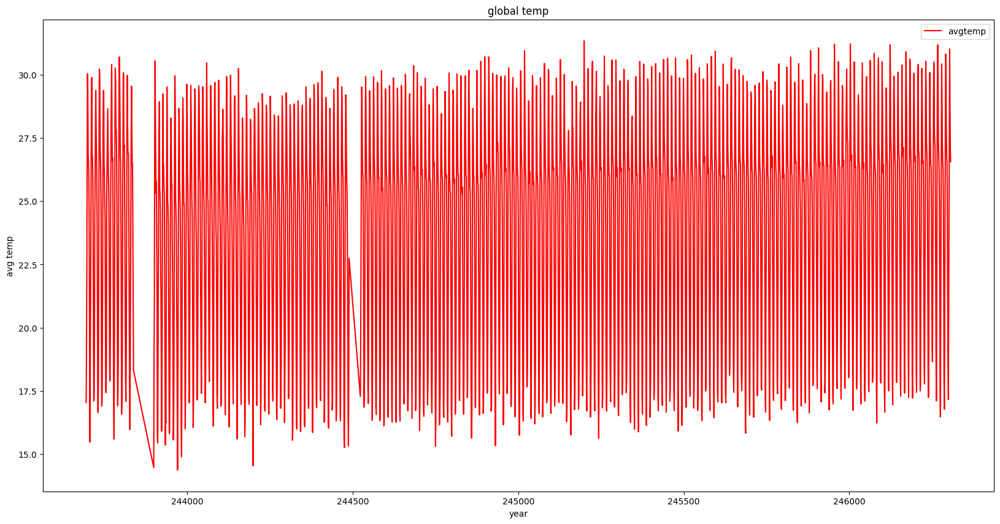

In [23]:
plt.figure(figsize=(20,10))
plt.plot(data.index, data['AverageTemperature'], color='red', label='avgtemp')
plt.xlabel('year')
plt.ylabel('avg temp')
plt.title('global temp')
plt.legend()
plt.show()

In [24]:
heatmapdata = df.pivot(index="Country", columns="dt",values="AverageTemperature")


In [25]:
heatmapdata.shape

(242, 3167)

In [26]:
# df['year'].max()

In [27]:
df=df[df['dt']>'1900-01-01']

In [28]:
df.head(100)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
1875,1900-02-01,-8.063,0.657,Åland
1876,1900-03-01,-3.196,0.467,Åland
1877,1900-04-01,0.781,0.224,Åland
1878,1900-05-01,4.960,0.503,Åland
1879,1900-06-01,12.296,1.129,Åland
...,...,...,...,...
1970,1908-01-01,-1.713,0.445,Åland
1971,1908-02-01,-1.582,0.592,Åland
1972,1908-03-01,-2.900,0.685,Åland
1973,1908-04-01,1.378,0.547,Åland


In [29]:
grph = df[df['Country'] == 'Andorra']


In [30]:
import plotly.express as px
fig = px.line(
    grph,
    x='dt',
    y='AverageTemperature',
    color='Country',
    title='',
    labels={'dt': 'Date', 'AverageTemperature': 'Avg Temperature (°C)'}
)
fig.update_layout(height=400, width=1000)
fig.show()

In [31]:
fig = px.choropleth(
    df,
    locations="Country",
    locationmode="country names",
    color="AverageTemperature",
    hover_name="Country",
    animation_frame="dt",
    title="Global Temperature Trends Over Time",
    color_continuous_scale="Viridis",
    labels={'AverageTemperature': 'Avg Temperature (°C)'}
)
fig.update_layout(height=600, width=1000)
fig.show()

In [32]:
df['year'] = df['dt'].dt.year
df['month'] = df['dt'].dt.month
# df['day_of_year'] = df['dt'].dt.dayofyear
# df['day_of_week'] = df['dt'].dt.dayofweek

df.drop(columns=['dt'], inplace=True)


In [33]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['CountryCode'] = label_encoder.fit_transform(df['Country'])

In [34]:
df.head(100)

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode
1875,-8.063,0.657,Åland,1900,2,241
1876,-3.196,0.467,Åland,1900,3,241
1877,0.781,0.224,Åland,1900,4,241
1878,4.960,0.503,Åland,1900,5,241
1879,12.296,1.129,Åland,1900,6,241
...,...,...,...,...,...,...
1970,-1.713,0.445,Åland,1908,1,241
1971,-1.582,0.592,Åland,1908,2,241
1972,-2.900,0.685,Åland,1908,3,241
1973,1.378,0.547,Åland,1908,4,241


In [35]:
avg = df[df['Country']=='India']
df.head()

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode
1875,-8.063,0.657,Åland,1900,2,241
1876,-3.196,0.467,Åland,1900,3,241
1877,0.781,0.224,Åland,1900,4,241
1878,4.960,0.503,Åland,1900,5,241
1879,12.296,1.129,Åland,1900,6,241


In [ ]:
# from sklearn.model_selection import TimeSeriesSplit

# # Assume df has columns: 'country', 'date', 'value'
# df = df.sort_values(by=['Country', 'year','month'])  # Ensure proper sorting

# splits = {}
# tscv = TimeSeriesSplit(n_splits=5)

# for country, data in df.groupby('Country'):
#     X = data.drop(columns=['AverageTemperature','AverageTemperatureUncertainty','Country'])  # Features
#     y = data['AverageTemperature']  # Target

#     country_splits = [(train_idx, test_idx) for train_idx, test_idx in tscv.split(X)]
#     splits[country] = country_splits

# print(splits)


In [36]:
def split_by_country(df, split_year):
    train_dfs = []
    test_dfs = []
    val_dfs = []

    for country, group in df.groupby("Country"):
        train = group[group["year"] < split_year -10]
        test = group[group["year"] >= split_year]
        val = group[(group['year'] >= split_year - 10) & (group['year'] < split_year)]

        train_dfs.append(train)
        test_dfs.append(test)
        val_dfs.append(val)

    # Combine splits
    train_df = pd.concat(train_dfs, ignore_index=True)
    test_df = pd.concat(test_dfs, ignore_index=True)
    val_df = pd.concat(val_dfs, ignore_index=True)

    return train_df, val_df, test_df

train_df, val_df, test_df = split_by_country(df, split_year=1990)

total_rows = len(df)
train_ratio = len(train_df) / total_rows
val_ratio = len(val_df) / total_rows
test_ratio = len(test_df) / total_rows

print(f"Train Ratio: {train_ratio:.2%}")
print(f"Validation Ratio: {val_ratio:.2%}")
print(f"Test Ratio: {test_ratio:.2%}")


Train Ratio: 70.24%
Validation Ratio: 8.84%
Test Ratio: 20.92%


In [37]:
train_df.tail(10)

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode
230783,-0.877,0.408,Åland,1979,3,241
230784,0.828,0.406,Åland,1979,4,241
230785,7.597,0.624,Åland,1979,5,241
230786,13.786,0.585,Åland,1979,6,241
230787,14.296,0.430,Åland,1979,7,241
230788,15.466,0.312,Åland,1979,8,241
230789,11.207,0.190,Åland,1979,9,241
230790,5.746,0.194,Åland,1979,10,241
230791,3.600,0.199,Åland,1979,11,241
230792,-0.761,0.529,Åland,1979,12,241


In [38]:
val_df.head()

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode
0,0.533,0.650,Afghanistan,1980,1,0
1,2.050,0.473,Afghanistan,1980,2,0
2,8.180,0.235,Afghanistan,1980,3,0
3,17.357,0.200,Afghanistan,1980,4,0
4,21.573,0.319,Afghanistan,1980,5,0


In [39]:
test_df.head(100)

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode
0,1.558,0.460,Afghanistan,1990,1,0
1,3.669,0.244,Afghanistan,1990,2,0
2,8.402,0.311,Afghanistan,1990,3,0
3,14.457,0.231,Afghanistan,1990,4,0
4,22.442,0.316,Afghanistan,1990,5,0
...,...,...,...,...,...,...
95,3.528,0.427,Afghanistan,1997,12,0
96,2.041,0.480,Afghanistan,1998,1,0
97,2.711,0.630,Afghanistan,1998,2,0
98,8.360,0.495,Afghanistan,1998,3,0


In [41]:
train_df.shape

(230793, 6)

In [42]:
test_df.shape

(68749, 6)

In [43]:
x_test =test_df.drop(['AverageTemperature','AverageTemperatureUncertainty','Country'], axis=1)
y_test= test_df[['AverageTemperature']]

In [44]:
x_val =val_df.drop(['AverageTemperature','AverageTemperatureUncertainty','Country'], axis=1)
y_val= val_df[['AverageTemperature']]

In [45]:
x_train =train_df.drop(['AverageTemperature','AverageTemperatureUncertainty','Country'], axis=1)
y_train= train_df[['AverageTemperature']]

In [46]:
x_train.head()

,year,month,CountryCode
0,1900,2,0
1,1900,3,0
2,1900,4,0
3,1900,5,0
4,1900,6,0


In [ ]:
country = train_df['Country'].unique()
len(country)

242

In [ ]:
# x =df.drop(['AverageTemperature','AverageTemperatureUncertainty','Country'], axis=1)
# y= df[['AverageTemperature']]

In [ ]:
x

,year,month,CountryCode
1875,1900,2,241
1876,1900,3,241
1877,1900,4,241
1878,1900,5,241
1879,1900,6,241
...,...,...,...
577456,2013,4,240
577457,2013,5,240
577458,2013,6,240
577459,2013,7,240


In [49]:
!pip install optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 2.2 MB/s eta 0:00:00


In [50]:
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
import sklearn
import optuna
from sklearn.model_selection import cross_val_score


In [48]:
# x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2,random_state=42)

In [ ]:
tss = TimeSeriesSplit(n_splits=3)

In [ ]:
for train_index, test_index in tss.split(x):
    x_train, x_test = x.iloc[train_index, :], x.iloc[test_index,:]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [ ]:
# @title xsgboost

def create(trial):
  params = {
          "n_estimators":trial.suggest_int("n_estimators",500,2000),
          "min_child_weight":trial.suggest_int('min_child_weight',1,5),
          "max_depth": trial.suggest_int("max_depth", 5, 10),
          "gamma":trial.suggest_float('gamma',0,0.5),
          "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
          "subsample": trial.suggest_float("subsample", 0.5, 1.0),
          "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
          #"reg_alpha":trial.suggest_float('reg_alpha',0 ,5),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
          "max_bin" :trial.suggest_int('max_bin',500,8000),
          "scale_pos_weight":trial.suggest_float('scale_pos_weight',7.0,16.0,),

      }
  return params

model=XGBRegressor(
#      learning_rate =0.1, max_depth=4,
#  min_child_weight=6, gamma=0, subsample=0.8, colsample_bytree=0.8,reg_alpha=0,
 tree_method="hist",eval_metric="auc")
def objective(trial):


    params=create(trial)
    model.set_params(**params)
    # model.fit(xtr, ytr)
    # predictions = model.predict(xte)
    # #acc = accuracy_score(yte, predictions, normalize=True)
    # rmse = -mean_squared_error(yte, predictions)

    cross = cross_val_score(model,x_train,y_train,cv=3, n_jobs=-1).mean()
    return cross

optuna.logging.set_verbosity(optuna.logging.INFO)
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

#print('Best hyperparameters:', study.best_params)
#print('Best RMSE:', study.best_value)
best_params=study.best_params
print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2025-01-30 14:53:06,162] A new study created in memory with name: no-name-53f0cd26-0e5e-4e53-bbe5-9cdce7074f06


[W 2025-01-30 14:53:09,559] Trial 0 failed with parameters: {'n_estimators': 601, 'min_child_weight': 4, 'max_depth': 5, 'gamma': 0.14835153363790027, 'learning_rate': 0.0980850309478387, 'subsample': 0.7811340043407373, 'colsample_bytree': 0.7278239065272221, 'lambda': 7.167458594457631e-06, 'alpha': 0.01600918231320367, 'max_bin': 2296, 'scale_pos_weight': 8.538102481939672} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/opt/miniconda3/lib/python3.12/site-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/var/folders/mt/wzxrfpvx0_qcn885x0hjlfvh0000gp/T/ipykernel_14419/556412806.py", line 35, in objective
    cross = cross_val_score(model,x_train,y_train,cv=3, n_jobs=-1).mean()
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/miniconda3/lib/python3.12/site-packages/sklearn/utils/_param_validation.py", line 213, in wrapp

KeyboardInterrupt: 

In [ ]:
# def objective(trial):
#     # Hyperparameters to tune
#     params = {
#         "objective": "reg:squarederror",
#         "eval_metric": "rmse",
#         "max_depth": trial.suggest_int("max_depth", 3, 10),
#         "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
#         # "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
#         "subsample": trial.suggest_float("subsample", 0.5, 1.0),
#         "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
#         "lambda": trial.suggest_float("lambda", 1e-3, 10.0),
#         "alpha": trial.suggest_float("alpha", 1e-3, 10.0),
#     }


#     dtrain = xgb.DMatrix(x_train, label=y_train)
#     dtest = xgb.DMatrix(x_test, label=y_test)

#     # Train model with early stopping using xgb.train
#     model = xgb.train(
#         params=params,
#         dtrain=dtrain,
#         num_boost_round=1000,
#         evals=[(dtest, "eval")],
#         early_stopping_rounds=50,
#         verbose_eval=False
#     )

#     # Predictions and evaluation
#     preds = model.predict(dtest)
#     rmse = mean_squared_error(y_test, preds, squared=False)
#     return rmse  # Minimize RMSE

# # Run optimization with Optuna
# study = optuna.create_study(direction="minimize")  # Minimize RMSE
# study.optimize(objective, n_trials=50)  # Number of trials

# # Best hyperparameters
# print("Best hyperparameters:", study.best_params)
# print("Best RMSE:", study.best_value)

In [ ]:
trial.params

{'min_child_weight': 4,
 'max_depth': 9,
 'gamma': 0.2739041942359088,
 'learning_rate': 0.16315648293708726,
 'subsample': 0.6011409441632602,
 'colsample_bytree': 0.7075054585261964,
 'lambda': 4.7604723074259356e-07,
 'alpha': 2.058601628746884e-06,
 'max_bin': 3431,
 'scale_pos_weight': 14.706474434226523}

In [53]:
import xgboost as xgb
print(xgb.__version__)
print(type(model))


2.1.4
<class 'xgboost.sklearn.XGBRegressor'>


[0]	validation_0-rmse:10.35608	validation_1-rmse:10.34014
[1]	validation_0-rmse:9.95082	validation_1-rmse:9.94267
[2]	validation_0-rmse:9.85207	validation_1-rmse:9.84754
[3]	validation_0-rmse:9.78209	validation_1-rmse:9.77751
[4]	validation_0-rmse:9.73397	validation_1-rmse:9.72861
[5]	validation_0-rmse:9.69956	validation_1-rmse:9.69371
[6]	validation_0-rmse:9.67484	validation_1-rmse:9.66224
[7]	validation_0-rmse:9.31753	validation_1-rmse:9.31211
[8]	validation_0-rmse:8.77180	validation_1-rmse:8.76008
[9]	validation_0-rmse:8.52629	validation_1-rmse:8.51806
[10]	validation_0-rmse:8.35735	validation_1-rmse:8.35398
[11]	validation_0-rmse:7.95872	validation_1-rmse:7.95302
[12]	validation_0-rmse:7.69575	validation_1-rmse:7.69305
[13]	validation_0-rmse:7.47604	validation_1-rmse:7.46648
[14]	validation_0-rmse:7.46417	validation_1-rmse:7.45154
[15]	validation_0-rmse:7.45592	validation_1-rmse:7.44092
[16]	validation_0-rmse:7.30015	validation_1-rmse:7.28901
[17]	validation_0-rmse:7.29412	validati

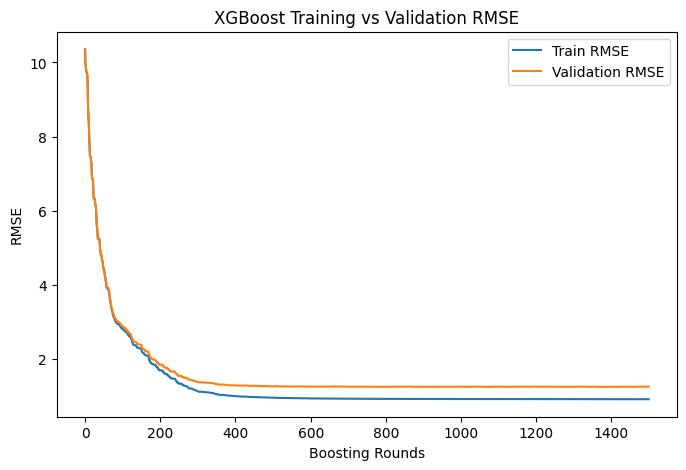

In [56]:

# model = XGBRegressor(n_estimators=500, learning_rate=0.15795638644018697, max_depth=10, subsample=0.9854437377561749, colsample_bytree=0.8644959075860605,random_state=42)
model = xgb.XGBRegressor(n_estimators =1500,min_child_weight= 4,
 max_depth= 9,
 gamma= 0.2739041942359088,
 learning_rate= 0.16315648293708726,
 subsample= 0.6011409441632602,
 colsample_bytree= 0.7075054585261964,
 reg_lambda= 4.7604723074259356e-07,
 alpha= 2.058601628746884e-06,
 max_bin= 3431,
 scale_pos_weight= 14.706474434226523)


model.set_params(eval_metric="rmse")

eval_set = [(x_train, y_train), (x_test, y_test)]

model.fit(
    x_train, y_train,
    eval_set=eval_set,
    verbose=True
)
# model = model.enhance(early_stopping=50)

evals_result = model.evals_result()

# ✅ Plot training vs validation RMSE
plt.figure(figsize=(8, 5))
plt.plot(evals_result["validation_0"]["rmse"], label="Train RMSE")
plt.plot(evals_result["validation_1"]["rmse"], label="Validation RMSE")
plt.xlabel("Boosting Rounds")
plt.ylabel("RMSE")
plt.title("XGBoost Training vs Validation RMSE")
plt.legend()
plt.show()



In [ ]:
y_pred = model.predict(x_test)
rmse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)
print(f"RSME: {rmse}")
print(f"r2 score: {r2}")

In [ ]:
input = np.array([[2050, 6, 102]])
input

array([[2050,    6,  102]])

In [ ]:
model.predict(input)

array([29.770964], dtype=float32)

In [ ]:
x_train

,year,month,CountryCode
0,1900,2,0
1,1900,3,0
2,1900,4,0
3,1900,5,0
4,1900,6,0
...,...,...,...
306292,2005,8,241
306293,2005,9,241
306294,2005,10,241
306295,2005,11,241


In [ ]:
annual_avg_temp = df.groupby(['Country', 'year'])['AverageTemperature'].mean().reset_index()
annual_avg_temp.rename(columns={'AverageTemperature': 'Annual_Avg_Temp'}, inplace=True)

In [ ]:
df = df.merge(annual_avg_temp, on=['Country', 'year'])
df.head()

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode,Annual_Avg_Temp_x,Annual_Avg_Temp_y,Annual_Avg_Temp
0,-8.063,0.657,Åland,1900,2,241,5.236364,5.236364,5.236364
1,-3.196,0.467,Åland,1900,3,241,5.236364,5.236364,5.236364
2,0.781,0.224,Åland,1900,4,241,5.236364,5.236364,5.236364
3,4.960,0.503,Åland,1900,5,241,5.236364,5.236364,5.236364
4,12.296,1.129,Åland,1900,6,241,5.236364,5.236364,5.236364


In [ ]:
d1=df.loc[df['CountryCode']==102]
d1.head(30)
d2=df.loc[df['year']==100]


d1

,AverageTemperature,AverageTemperatureUncertainty,Country,year,month,CountryCode,Annual_Avg_Temp_x,Annual_Avg_Temp_y,Annual_Avg_Temp
139171,20.050,0.694,India,1900,2,102,25.002636,25.002636,25.002636
139172,24.958,0.463,India,1900,3,102,25.002636,25.002636,25.002636
139173,27.672,0.491,India,1900,4,102,25.002636,25.002636,25.002636
139174,29.772,0.237,India,1900,5,102,25.002636,25.002636,25.002636
139175,29.928,0.500,India,1900,6,102,25.002636,25.002636,25.002636
...,...,...,...,...,...,...,...,...,...
140529,27.981,0.299,India,2013,4,102,25.413250,25.413250,25.413250
140530,31.014,0.205,India,2013,5,102,25.413250,25.413250,25.413250
140531,28.766,0.299,India,2013,6,102,25.413250,25.413250,25.413250
140532,27.012,0.197,India,2013,7,102,25.413250,25.413250,25.413250


In [ ]:
fig = px.line(
    d1,
    x='year',
    y='Annual_Avg_Temp',
    color='Country',
    title='',
    labels={'year': 'Year', 'Annual_Avg_Temp': 'Avg Temperature (°C)'}
)
fig.update_layout(height=400, width=1000)
fig.show()